# Dependancies

In [ ]:
# Railroad Worker Detection
# Base Model | Variation - 03

import os
import yaml
import json
import shutil
import random
import zipfile
from shutil import copyfile
from itertools import chain
from google.colab import files

import numpy
from PIL import Image
import matplotlib.pyplot

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
def indexer():
    import re
    from datetime import datetime
    return re.sub('[:, ,.,-]',"",str(datetime.now()))

indexer()

'20231130124052189990'

In [ ]:
!pip install addict

In [ ]:
!git clone https://github.com/meituan/YOLOv6.git

Cloning into 'YOLOv6'...
remote: Enumerating objects: 3809, done.
remote: Counting objects: 100% (1689/1689), done.
remote: Compressing objects: 100% (306/306), done.
remote: Total 3809 (delta 1493), reused 1390 (delta 1383), pack-reused 2120
Receiving objects: 100% (3809/3809), 47.10 MiB | 27.83 MiB/s, done.
Resolving deltas: 100% (2325/2325), done.


In [ ]:
%cd YOLOv6
!pip install -r requirements.txt

/content/YOLOv6
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 37.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 72.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
cupy-cuda11x 11.0.0 requires numpy<1.26,>=1.20, but you have numpy 1.26.2 which is incompatible.


# Data Preprocessing

In [ ]:
# import the kaggle credential file for authentication
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"thlurte","key":"68a6b1c43eecf20aa8aaa2fc333c9146"}'}

In [ ]:
# Necessary file changes
!rm -r ~/.kaggle # In case if /.kaggle exists remove it and its contents
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

rm: cannot remove '/root/.kaggle': No such file or directory


In [ ]:
# Download the dataset directly from Kaggle
!kaggle datasets download -d mikhailma/railroad-worker-detection-dataset --force

100% 2.87G/2.87G [00:35<00:00, 109MB/s]
100% 2.87G/2.87G [00:35<00:00, 87.7MB/s]


In [ ]:
# Extract the contents of the dataset using zipfile module
zip_file = zipfile.ZipFile('/content/YOLOv6/railroad-worker-detection-dataset.zip','r')
zip_file.extractall('/content')
zip_file.close()

In [ ]:
# functions to display the image from dataset
def random_img_finder(url):
  return random.choice(list(os.walk(url))[0][2])
def img_plotter(url,nrows,ncols):
  fig,ax=matplotlib.pyplot.subplots(nrows=nrows,ncols=ncols,figsize=(20,12))
  for i in range(ncols):
    for j in range(nrows):
      img=random_img_finder(url)
      ax[i][j].imshow(numpy.asarray(Image.open(f'{url}/{img}')))
      ax[i][j].axis('off')

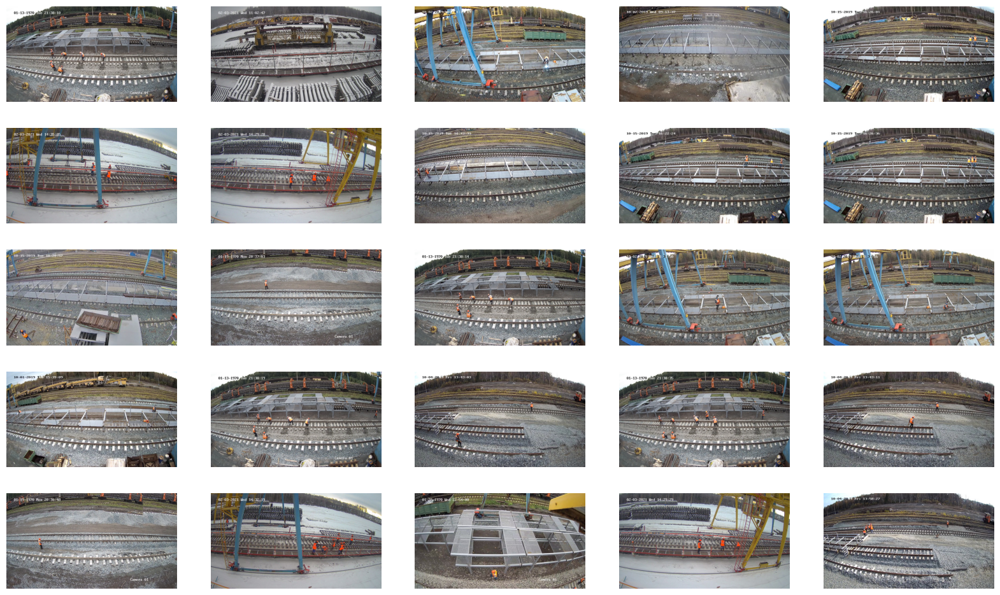

In [ ]:
# visualize the images
img_plotter('/content/dataset/imgs',5,5)

## Train Test Split

In [ ]:
#  directory of the original dataset
img_dir='/content/dataset/imgs'
annt_dir='/content/dataset/txt'
#  directory where images will be sent
img_base='/content/dataset/images'
annt_base='/content/dataset/labels'

def split_dataset(img_dir,img_base,annt_base,annt_dir,train_ratio=.8,test_ratio=.1,val_ratio=.1):
  # create train, test and val dataset
  for folder in ["train","val","test"]:
    os.makedirs(os.path.join(img_base,folder) ,exist_ok=True)
    os.makedirs(os.path.join(annt_base,folder), exist_ok=True)

  # get the list of all images and annotation files
  img_files=os.listdir(img_dir)
  annt_files=os.listdir(annt_dir)

  # validate that all images in the dataset has rexpective annotation
  img_files = [file for file in img_files if file.replace(".jpg", ".txt") in annt_files]

  # shuffle the files
  random.shuffle(img_files)

  # split the files into train, val, and test sets
  num_files = len(img_files)
  num_train = int(train_ratio * num_files)
  num_val = int(val_ratio * num_files)

  train_files = img_files[:num_train]
  val_files = img_files[num_train:num_train + num_val]
  test_files = img_files[num_train + num_val:]

  # copy files to their respective folders
  for _file in train_files:
    copyfile(os.path.join(img_dir, _file), os.path.join(img_base, 'train', _file))
    copyfile(os.path.join(annt_dir, _file.replace(".jpg", ".txt")), os.path.join(annt_base, 'train', _file.replace(".jpg", ".txt")))

  for _file in test_files:
    copyfile(os.path.join(img_dir,_file),os.path.join(img_base, 'test', _file))
    copyfile(os.path.join(annt_dir, _file.replace(".jpg", ".txt")), os.path.join(annt_base, 'test', _file.replace(".jpg", ".txt")))

  for _file in val_files:
    copyfile(os.path.join(img_dir, _file), os.path.join(img_base, 'val', _file))
    copyfile(os.path.join(annt_dir, _file.replace(".jpg", ".txt")), os.path.join(annt_base, 'val', _file.replace(".jpg", ".txt")))



In [ ]:
# executing the function
split_dataset(img_dir,img_base,annt_base,annt_dir,train_ratio=.8,test_ratio=.1,val_ratio=.1)

# Exploratry Data Analysis

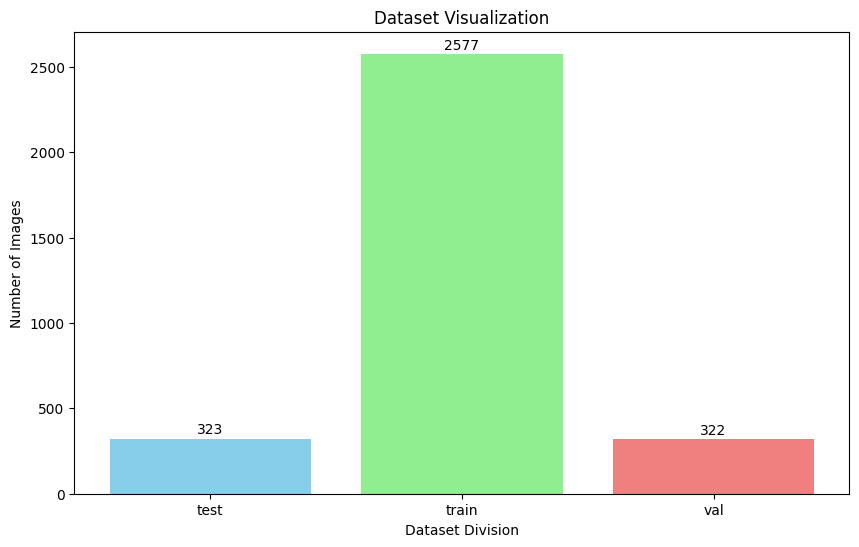

In [ ]:
# visualize the dataset
# directory of image
_div=os.listdir('/content/dataset/images')


# directory of each portion of the dataset
_train=len(os.listdir('/content/dataset/images/train'))
_test=len(os.listdir('/content/dataset/images/test'))
_val=len(os.listdir('/content/dataset/images/val'))

matplotlib.pyplot.figure(figsize=(10, 6))
colors = ['skyblue', 'lightgreen', 'lightcoral']
matplotlib.pyplot.bar(_div,(_test,_train,_val),color=colors)
# adding data labels
for i, count in enumerate([_test, _train, _val]):
    matplotlib.pyplot.text(i, count + 10, str(count), ha='center', va='bottom')

# adding labels and title
matplotlib.pyplot.xlabel('Dataset Division')
matplotlib.pyplot.ylabel('Number of Images')
matplotlib.pyplot.title('Dataset Visualization');

In [ ]:
print(f'Number of images available in train set: {_train}')
print(f'Number of images available in test set: {_test}')
print(f'Number of images available in val set: {_val}')

Number of images available in train set: 2577
Number of images available in test set: 323
Number of images available in val set: 322


In [ ]:
def read_class_details(file_path):
  with open(file_path,'r') as fileq:
    lines = fileq.readlines()

    data=[]
    for line in lines:
      values=line[0]
      data.append(values)
  return data

def class_distribution(path):
  l=[]
  for i in os.listdir(path):
    l.append(read_class_details(path+'/'+i))
  return l
classes=['vest','helmet','worker']

In test set, the vest has 761 annotations
In test set, the helmet has 635 annotations
In test set, the worker has 766 annotations


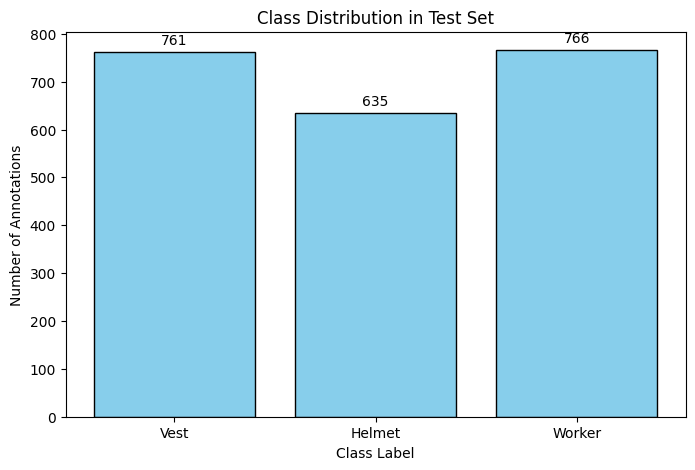

In [ ]:
test_class_distribution=list(chain.from_iterable(class_distribution('/content/dataset/labels/test')))
count_vest = test_class_distribution.count('0')
count_helmet = test_class_distribution.count('1')
count_worker = test_class_distribution.count('2')

# Plot the histogram
matplotlib.pyplot.figure(figsize=(8, 5))
bars = matplotlib.pyplot.bar(['Vest', 'Helmet', 'Worker'], [count_vest, count_helmet, count_worker], color='skyblue', edgecolor='black')

# Add labels to the bars
for bar in bars:
    matplotlib.pyplot.text(bar.get_x() + bar.get_width() / 2 , bar.get_height() + 10, str(int(bar.get_height())), ha='center', va='bottom')
matplotlib.pyplot.xlabel('Class Label')
matplotlib.pyplot.ylabel('Number of Annotations')
matplotlib.pyplot.title('Class Distribution in Test Set')
print(f"In test set, the vest has {test_class_distribution.count('0')} annotations")
print(f"In test set, the helmet has {test_class_distribution.count('1')} annotations")
print(f"In test set, the worker has {test_class_distribution.count('2')} annotations")

In train set, the vest has 761 annotations
In train set, the helmet has 635 annotations
In train set, the worker has 766 annotations


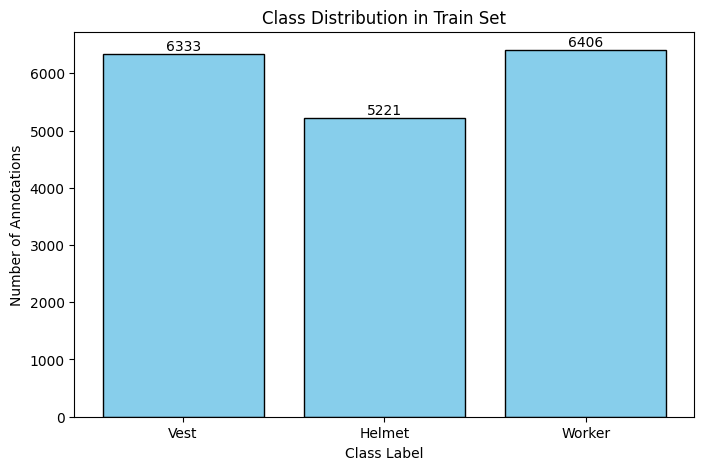

In [ ]:
train_class_distribution=list(chain.from_iterable(class_distribution('/content/dataset/labels/train')))
count_vest = train_class_distribution.count('0')
count_helmet = train_class_distribution.count('1')
count_worker = train_class_distribution.count('2')

matplotlib.pyplot.figure(figsize=(8, 5))
bars = matplotlib.pyplot.bar(['Vest', 'Helmet', 'Worker'], [count_vest, count_helmet, count_worker], color='skyblue', edgecolor='black')

for bar in bars:
    matplotlib.pyplot.text(bar.get_x() + bar.get_width() / 2 , bar.get_height() + 10, str(int(bar.get_height())), ha='center', va='bottom')
matplotlib.pyplot.xlabel('Class Label')
matplotlib.pyplot.ylabel('Number of Annotations')
matplotlib.pyplot.title('Class Distribution in Train Set')
print(f"In train set, the vest has {test_class_distribution.count('0')} annotations")
print(f"In train set, the helmet has {test_class_distribution.count('1')} annotations")
print(f"In train set, the worker has {test_class_distribution.count('2')} annotations")

In val set, the vest has 761 annotations
In val set, the helmet has 635 annotations
In val set, the worker has 766 annotations


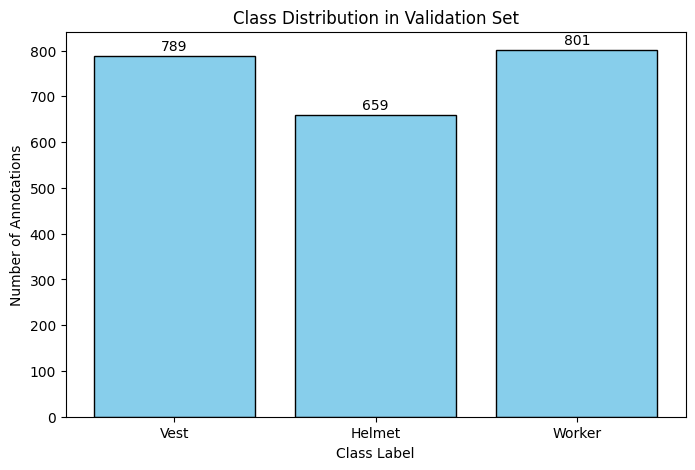

In [ ]:
val_class_distribution=list(chain.from_iterable(class_distribution('/content/dataset/labels/val')))
count_vest = val_class_distribution.count('0')
count_helmet = val_class_distribution.count('1')
count_worker = val_class_distribution.count('2')

matplotlib.pyplot.figure(figsize=(8, 5))
bars = matplotlib.pyplot.bar(['Vest', 'Helmet', 'Worker'], [count_vest, count_helmet, count_worker], color='skyblue', edgecolor='black')

for bar in bars:
    matplotlib.pyplot.text(bar.get_x() + bar.get_width() / 2 , bar.get_height() + 5, str(int(bar.get_height())), ha='center', va='bottom')
matplotlib.pyplot.xlabel('Class Label')
matplotlib.pyplot.ylabel('Number of Annotations')
matplotlib.pyplot.title('Class Distribution in Validation Set')
print(f"In val set, the vest has {test_class_distribution.count('0')} annotations")
print(f"In val set, the helmet has {test_class_distribution.count('1')} annotations")
print(f"In val set, the worker has {test_class_distribution.count('2')} annotations")

# Model Training

In [ ]:
%cd YOLOv6
!ls

[Errno 2] No such file or directory: 'YOLOv6'
/content/YOLOv6
assets	 deploy      inference.ipynb			    README_cn.md      tools
configs  docs	     LICENSE				    README.md	      tutorial.ipynb
data	 hubconf.py  railroad-worker-detection-dataset.zip  requirements.txt  yolov6


In [ ]:
# modify the yaml file to feed in data
dict_file = {'train': '/content/dataset/images/train',
            'val': '/content/dataset/images/val',
            'test': '/content/dataset/images/test',
            'nc' : 3,
            'names' : ['vest','helmet','worker']}

with open('/content/YOLOv6/data/dataset.yaml', 'w+') as file:
    documents = yaml.dump(dict_file, file)

In [ ]:
# Be sure to open use_dfl mode in config file (use_dfl=True, reg_max=16) if you want to do self-distillation training further.
!python tools/train.py --batch 32 --data data/dataset.yaml --device 0 --epochs 8

2023-12-02 03:20:53.657464: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-02 03:20:53.657534: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-02 03:20:53.657577: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-02 03:20:53.669920: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-02 03:20:55.329975: W tensorflow/compiler/

# Model Evaluation

In [ ]:
!python tools/eval.py --data data/dataset.yaml --weights /content/YOLOv6/runs/train/exp/weights/best_ckpt.pt --task val --device 0

Namespace(data='data/dataset.yaml', weights='/content/YOLOv6/runs/train/exp/weights/best_ckpt.pt', batch_size=32, img_size=640, conf_thres=0.03, iou_thres=0.65, task='val', device='0', half=False, save_dir='runs/val/', name='exp', shrink_size=0, infer_on_rect=True, reproduce_640_eval=False, eval_config_file='./configs/experiment/eval_640_repro.py', do_coco_metric=True, do_pr_metric=False, plot_curve=True, plot_confusion_matrix=False, verbose=False, config_file='', specific_shape=False, height=None, width=None)
Loading checkpoint from /content/YOLOv6/runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
Model Summary: Params: 4.63M, Gflops: 11.34
img record infomation path is:/content/dataset/images/.val_cache.json
Val: Checking formats of labels with 2 process(es): 
322 label(s) found, 0 label(s) missing, 14 label(s) empty, 0 invalid label files: 100% 322/322 [00:00<00:00, 2498.96it/s]
Convert to COCO format
100% 322/322 [00:00<00:00, 42673.26it/s]
Conve

In [ ]:
%tensorboard --logdir /content/YOLOv6/runs/train/exp

<IPython.core.display.Javascript object>

In [ ]:
shutil.make_archive('train_details','zip','/content/YOLOv6/runs/train/')

'/content/YOLOv6/train_details.zip'

In [ ]:
shutil.make_archive('test_results','zip','/content/YOLOv6/runs/val/')

'/content/YOLOv6/test_results.zip'